# Import library

In [1]:
import warnings
warnings.filterwarnings("ignore")
import netCDF4 as nc
from netCDF4 import Dataset
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr    
import glob
import os
import cartopy.crs as ccrs
import matplotlib.colors as colors
import pandas as pd
import datetime
from matplotlib import colors
import pymannkendall as mk
from matplotlib.ticker import MaxNLocator
from string import ascii_lowercase

In [4]:
land_sea = xr.open_dataset("/g/data/w97/sl7808/landmask_accessESM1-5_AUS.nc").sftlf


def plot_spec(ax,nn):
    ax[nn].coastlines()
    ax[nn].set_ylabel('')
    ax[nn].set_xlabel('')
    ax[nn].axis('on')

#define mk test for np_apply_along_axis 
def mk_miss_trend(data):
    mask=~np.isnan(data)
    if (mask.any() == False):
        return np.nan
    else:
        mkk = mk.original_test(data[mask])
        if mkk.trend == 'increasing':
          xx=1
        elif mkk.trend == 'decreasing':
          xx=-1
        else:
          xx=0
        return xx


def mk_miss_slope(data):
    '''data and tos should both be 1D arrays'''
    # select the non-NAN:
    mask=~np.isnan(data)
    if (mask.any() == False):
        return np.nan
    else:
        mkk = mk.original_test(data[mask])
        return (mkk.slope)*10

def mk_miss_p(data):
    '''data and tos should both be 1D arrays'''
    # select the non-NAN:
    mask=~np.isnan(data)
    if (mask.any() == False):
        return np.nan
    else:
        mkk = mk.original_test(data[mask])
        return mkk.p



# Figure 3

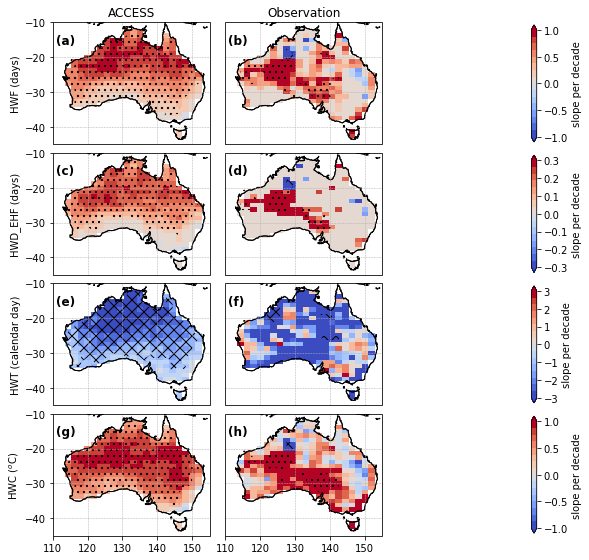

In [58]:

HWX_list =["HWF_EHF","HWD_EHF","HWT_EHF","HWC"]
HWX_list_2 =["HWF (days)","HWD_EHF (days)","HWT (calendar day)",'HWC ($^o$C)']

xxx_1=[1,0.3,3,1]
nnn_1=[-1,-0.3,-3,-1]
num=0

#Plot
fig, axs = plt.subplots( figsize=(9,12))
cmap2 = plt.cm.get_cmap("coolwarm", 16)


ax={}
for i in range(12):
    ax[i] = plt.subplot(4,3,i+1,projection=ccrs.PlateCarree())
    ax[i].axis('on')

for (h,xxx,nnn,h2) in zip (HWX_list,xxx_1,nnn_1,HWX_list_2):

    
    
    a=xr.open_dataset("/g/data/w97/sl7808/ALLOUTPUT/EHF_year_ACCESS/by_HWX/"+h+".nc", decode_times=False)
    a1=a[h]
    ACCESS=a1.where(a1>0).isel(time=slice(60,163)).where(land_sea>60)

    HWX_obs = xr.open_dataset("/g/data/w97/sl7808/ALLOUTPUT/EHF_obs/new/"+h+".nc",decode_times=False)
    HWX_o_1=HWX_obs[h]
    HWX_o=HWX_o_1.where(HWX_o_1>0).isel(time=slice(0,103)).where(land_sea>60)


    #observation
    num_o=num+1
    


    mk_t=np.apply_along_axis(mk_miss_trend,0,HWX_o[...])
    mk_h=np.apply_along_axis(mk_miss_slope,0,HWX_o[...])
    mk_p=np.apply_along_axis(mk_miss_p,0,HWX_o[...])
    
    mkval=xr.DataArray(mk_h,dims=["lat","lon"],coords={"lat":HWX_o.lat,"lon":HWX_o.lon})
    mkval.plot(ax=ax[num_o],cmap=cmap2,vmax=xxx,vmin=nnn, add_colorbar=False,xlim=[110,155],ylim=[-45,-10])

    mkval_2=xr.DataArray(mk_t,dims=["lat","lon"],coords={"lat":HWX_o.lat,"lon":HWX_o.lon})
    mkval_3=xr.DataArray(mk_p,dims=["lat","lon"],coords={"lat":HWX_o.lat,"lon":HWX_o.lon})
    
    mkval_2_3=mkval_2.where(mkval_3<0.05)
    
    pp=mkval_2_3.plot.contourf(ax=ax[num_o],levels=[-1,-0.5,0.5,1],colors='none',hatches=['xx', '', '..'], add_colorbar=False,xlim=[110,155],ylim=[-45,-10])

    #obs plot
    plot_spec(ax,num_o)
    ax[num_o].coastlines()
    ax[num].set_yticks([-40, -30, -20, -10], crs=ccrs.PlateCarree())

    
    
    #ACCESS ensemble mean
    HWX_A=ACCESS.mean(dim="ensemble").where(land_sea>60)
    mk_h=np.apply_along_axis(mk_miss_slope,0,HWX_A[...]) 
    mkval=xr.DataArray(mk_h,dims=["lat","lon"],coords={"lat":HWX_A.lat,"lon":HWX_A.lon})

    #trend 
    mk_t=np.apply_along_axis(mk_miss_trend,0,HWX_A[...])
    mkval_t=xr.DataArray(mk_t,dims=["lat","lon"],coords={"lat":HWX_A.lat,"lon":HWX_A.lon})
    
    #p-value 
    mk_p=np.apply_along_axis(mk_miss_p,0,HWX_A[...])
    mkval_p=xr.DataArray(mk_p,dims=["lat","lon"],coords={"lat":HWX_A.lat,"lon":HWX_A.lon})


    p=mkval.plot(ax=ax[num],cmap=cmap2,vmax=xxx,vmin=nnn, add_colorbar=False,xlim=[110,155],ylim=[-45,-10])
    mkval_t.where(mkval_p<0.05).plot.contourf(ax=ax[num],levels=[-1,-0.5,0.5,1],colors='none',hatches=['xx', '', '..'], add_colorbar=False,xlim=[110,155],ylim=[-45,-10])

    
        
    ax[num].coastlines()
    plot_spec(ax,num)


    
    #colourbar
    num_col=num+2
    ax[num_col].axis('off')
    ax[num].set_ylabel(h2)
    
    if num==0:
        ticklist=[-1,-0.5,0,0.5,1]
    elif num==3:
        ticklist=[-0.3,-0.2,-0.1,0,0.1,0.2,0.3]
    elif num==6:
        ticklist=[-3,-2,-1,0,1,2,3]
    elif num==9:
        ticklist=[-1,-0.5,0,0.5,1]    
    
    
    
    fig.colorbar(p, ax=ax[num_col], orientation='vertical',extend='both',label='slope per decade', shrink=0.45, pad=0.2,ticks=ticklist)

    
    num=num+3

    

ax[0].set_title("ACCESS") 
ax[1].set_title("Observation") 


a_list=[0,3,6,9]
a=0

for aaa in a_list:
    ax[aaa].gridlines(ylocs=[-10,-20,-30,-40],draw_labels=False,
                       linewidth=0.5, linestyle='--', edgecolor='dimgrey')  
    ax[aaa].text(0.02,0.80,'(%s)' %(ascii_lowercase[a]),
            horizontalalignment='left',verticalalignment='bottom',
            transform = ax[aaa].transAxes,fontweight='bold', fontsize=12)
    aaa_2=aaa+1
    a=a+1
    ax[aaa_2].text(0.02,0.80,'(%s)' %(ascii_lowercase[a]),
            horizontalalignment='left',verticalalignment='bottom',
            transform = ax[aaa_2].transAxes,fontweight='bold', fontsize=12)
    ax[aaa_2].gridlines(ylocs=[-10,-20,-30,-40],draw_labels=False,
                       linewidth=0.5, linestyle='--', edgecolor='dimgrey')

    a=a+1
    

ax[9].set_xticks([110,120,130,140,150], crs=ccrs.PlateCarree())
ax[10].set_xticks([110,120,130,140,150], crs=ccrs.PlateCarree())

fig.subplots_adjust(wspace=0.1, hspace=-0.5)






# Appendix 

In [83]:

    
def mktest(HWX_EHF,mk_miss_xxx,xxx,nnn,ttttt,ticklist):
    
    cmap2 = plt.cm.get_cmap("coolwarm", 16)
    d = ("/g/data/w97/sl7808/ALLOUTPUT/EHF_year_ACCESS/by_HWX/"+HWX_EHF+".nc") 
    d1=xr.open_dataset(d, decode_times=False)
    ACCESS=d1[HWX_EHF].isel(time=slice(60,163))



    #HWX_obs = xr.open_dataset("/g/data/w97/sl7808/ehf_AGCD/EHF_heatwaves____yearly_summer.nc",decode_times=False)
    HWX_obs = xr.open_dataset("/g/data/w97/sl7808/ALLOUTPUT/EHF_obs/new/"+HWX_EHF+".nc",decode_times=False)


    obs=HWX_obs[HWX_EHF]  
    HWX_o=obs.where(obs>0).isel(time=slice(0,103)).where(land_sea>60)

    #Plot
    fig, axs = plt.subplots( figsize=(15,10),dpi=600)#, sharex=True, sharey=True, squeeze=True)



    ax={}
    for i in range(25):
        ax[i] = plt.subplot(5,5,i+1,projection=ccrs.PlateCarree())
        ax[i].axis('off')
        

    #observation
    mk_t=np.apply_along_axis(mk_miss_trend,0,HWX_o[...])
    mk_h=np.apply_along_axis(mk_miss_xxx,0,HWX_o[...])
    mk_p=np.apply_along_axis(mk_miss_p,0,HWX_o[...])
    
    mkval=xr.DataArray(mk_h,dims=["lat","lon"],coords={"lat":HWX_o.lat,"lon":HWX_o.lon})
    mkval.plot(ax=ax[0],cmap=cmap2,vmax=xxx,vmin=nnn, add_colorbar=False,xlim=[110,155],ylim=[-45,-10])

 
    mkval_2=xr.DataArray(mk_t,dims=["lat","lon"],coords={"lat":HWX_o.lat,"lon":HWX_o.lon})
    mkval_3=xr.DataArray(mk_p,dims=["lat","lon"],coords={"lat":HWX_o.lat,"lon":HWX_o.lon})
    
    mkval_2_3=mkval_2.where(mkval_3<0.05)
    
    pp=mkval_2_3.plot.contourf(ax=ax[0],levels=[-1,-0.5,0.5,1],colors='none',hatches=['xx', '', '..'], add_colorbar=False,xlim=[110,155],ylim=[-45,-10])

    
    
    #obs plot
    plot_spec(ax,0)
    ax[0].set_title('Oberservation') 
    ax[0].axis('on')
    ax[0].text(0.02,0.80,'(%s)' %(ascii_lowercase[0]),horizontalalignment='left',verticalalignment='bottom',transform = ax[0].transAxes,fontweight='bold', fontsize=12)
    ax[0].gridlines(ylocs=[-10,-20,-30,-40],draw_labels=False,
                       linewidth=0.5, linestyle='--', edgecolor='dimgrey') 



    #ACCESS
    for i in range(20):
        HWX_A=ACCESS.isel(ensemble=i).where(land_sea>60)
        mk_t=np.apply_along_axis(mk_miss_trend,0,HWX_A[...])
        #HWX_1=HWX_o.where(mk_t!=0)
        mk_h=np.apply_along_axis(mk_miss_xxx,0,HWX_A[...])

        mkval=xr.DataArray(mk_h,dims=["lat","lon"],coords={"lat":HWX_A.lat,"lon":HWX_A.lon})
        p=mkval.plot(ax=ax[i+5],cmap=cmap2,vmax=xxx,vmin=nnn, add_colorbar=False,xlim=[110,155],ylim=[-45,-10])

        mkval_2=xr.DataArray(mk_t,dims=["lat","lon"],coords={"lat":HWX_A.lat,"lon":HWX_A.lon})
        pp=mkval_2.plot.contourf(ax=ax[i+5],levels=[-1,-0.5,0.5,1],colors='none',hatches=['xx', '', '..'], add_colorbar=False,xlim=[110,155],ylim=[-45,-10])
        plot_spec(ax,i+5)
        ax[i+5].axis('on')
        ax[i+5].gridlines(ylocs=[-10,-20,-30,-40],draw_labels=False,
                       linewidth=0.5, linestyle='--', edgecolor='dimgrey') 
        aaa=i+2
        ax[i+5].text(0.02,0.80,'(%s)' %(ascii_lowercase[aaa]),horizontalalignment='left',verticalalignment='bottom',transform = ax[i+5].transAxes,fontweight='bold', fontsize=12)




    #ACCESS ensemble mean
    mkval_a=[]
    mkval_t_a=[]
    HWX_A=ACCESS.mean(dim="ensemble").where(land_sea>60)
    mk_h=np.apply_along_axis(mk_miss_slope,0,HWX_A[...]) 
    mkval=xr.DataArray(mk_h,dims=["lat","lon"],coords={"lat":HWX_A.lat,"lon":HWX_A.lon})

    #trend 
    mk_t=np.apply_along_axis(mk_miss_trend,0,HWX_A[...])
    mkval_t=xr.DataArray(mk_t,dims=["lat","lon"],coords={"lat":HWX_A.lat,"lon":HWX_A.lon})

    #p-value 
    mk_p=np.apply_along_axis(mk_miss_p,0,HWX_A[...])
    mkval_p=xr.DataArray(mk_p,dims=["lat","lon"],coords={"lat":HWX_A.lat,"lon":HWX_A.lon})


    p=mkval.plot(ax=ax[1],cmap=cmap2,vmax=xxx,vmin=nnn, add_colorbar=False,xlim=[110,155],ylim=[-45,-10])
    mkval_t.where(mkval_p<0.05).plot.contourf(ax=ax[1],levels=[-1,-0.5,0.5,1],colors='none',hatches=['xx', '', '..'], add_colorbar=False,xlim=[110,155],ylim=[-45,-10])
  

    ax[1].coastlines()
    ax[1].axis('on')
    ax[1].text(0.02,0.80,'(%s)' %(ascii_lowercase[1]),horizontalalignment='left',verticalalignment='bottom',transform = ax[1].transAxes,fontweight='bold', fontsize=12)
    ax[1].gridlines(ylocs=[-10,-20,-30,-40],draw_labels=False,
                       linewidth=0.5, linestyle='--', edgecolor='dimgrey') 
    ax[1].set_title("Ensemble mean") 
    ax[5].set_title("Individual ensemble") 



    fig.colorbar(p, ax=ax[3], orientation='horizontal',extend='both',label='',ticks=ticklist)


    for k in range (5):
        j=k+20
        h=k*5
        ax[j].set_xticks([110, 120, 130, 140, 150], crs=ccrs.PlateCarree())
        ax[h].set_yticks([-40, -30, -20, -10], crs=ccrs.PlateCarree())


    ax[3].text(0.5,0.01,ttttt,
                horizontalalignment='center',verticalalignment='bottom',
                transform = ax[3].transAxes, fontsize=12)



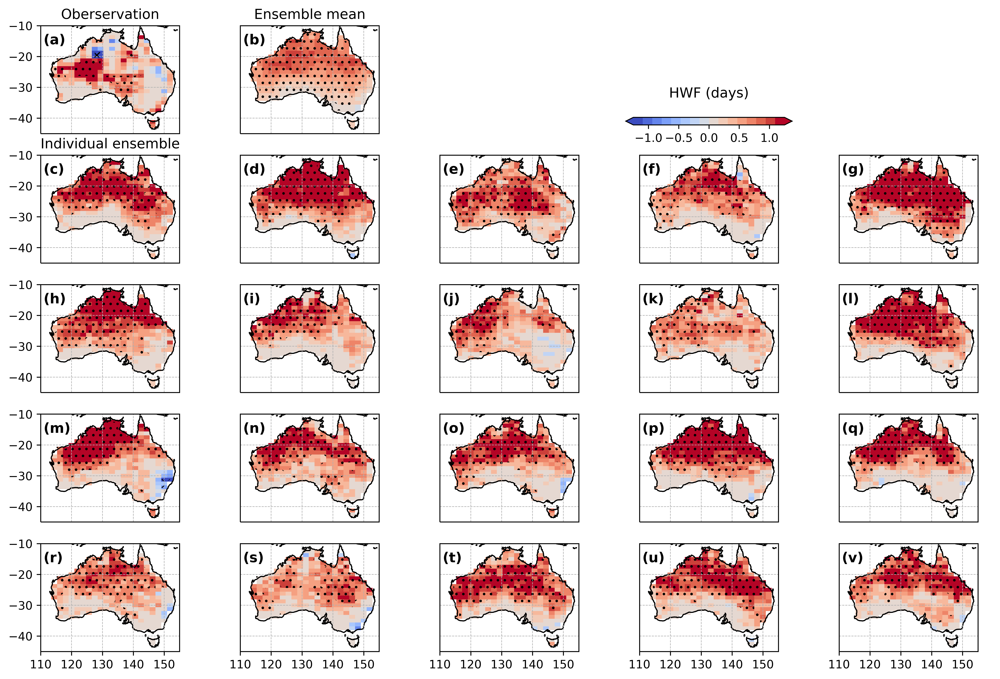

In [84]:
mktest("HWF_EHF",mk_miss_slope,1.25,-1.25,"HWF (days)",[-1,-0.5,0,0.5,1])

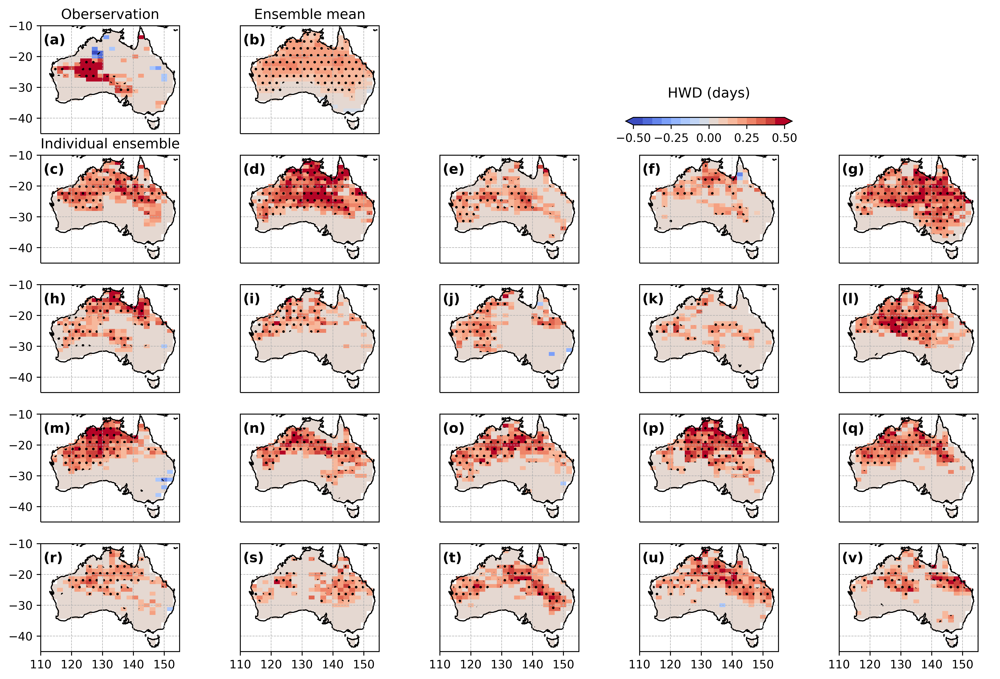

In [85]:
mktest("HWD_EHF",mk_miss_slope,0.5,-0.5,"HWD (days)",[-0.5,-0.25,0,0.25,0.5])

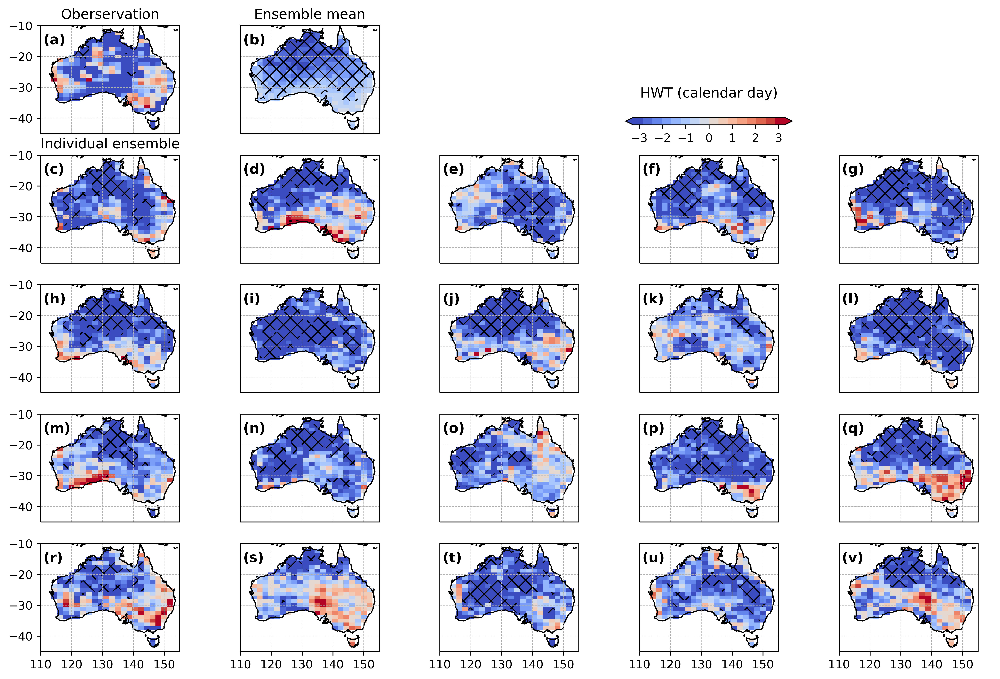

In [86]:
mktest("HWT_EHF",mk_miss_slope,3.25,-3.25,"HWT (calendar day)",[-3,-2,-1,0,1,2,3])

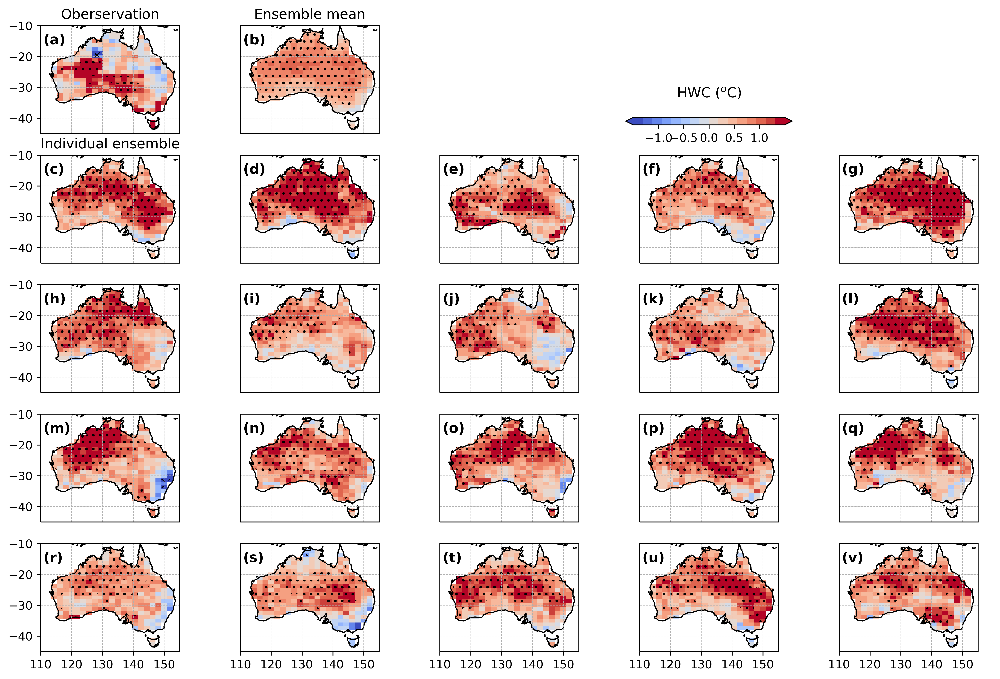

In [87]:
mktest("HWC",mk_miss_slope,1.5,-1.5,'HWC ($^o$C)',[-1,-0.5,0,0.5,1])